In [1]:
import pandas as pd
import seaborn as sns
import re
import os
import numpy as np
from matplotlib_venn import venn3
import matplotlib.pyplot as plt
from palaeoPSM.psm_read import FragPipeRun, filter_psms
from palaeoPSM.psm_to_long import psm_to_long
from Bio import SeqIO
import plotly.express as px
from upsetplot import from_contents, UpSet

In [2]:
db1 = '../databases/DB1_bovin_ArchaeocRAP3.2.fasta'
record_dict = SeqIO.to_dict(SeqIO.parse(db1, "fasta"))

contams = '../databases/contams_nomilk.fasta'
contams_dict = SeqIO.to_dict(SeqIO.parse(contams, "fasta"))
lacb = [
    'sp|P02754A|LACB_BOVIN',
    'sp|P02754B|LACB_BOVIN',
    'sp|P02754C|LACB_BOVIN',
    'sp|P02754D|LACB_BOVIN'
]

caseins = [
    'Alpha-S1-casein',
    'Alpha-S2-casein',
    'Beta-casein',
    'Kappa-casein'
]

fp_run = '../fp_results/milk_st_db1_extra'
save_folder = '../milk_analysis_results/'
main_ptms = ["Carbamylation", "Lactosylation", "Phosphorylation", "Iodoacetic acid derivative",
             "Oxidation or Hydroxylation", "Formylation", "Dehydration/Pyro-glu from E + Deletion of Q"]

In [3]:
def export_legend(legend, filename="legend.png"):
    fig = legend.figure
    fig.canvas.draw()
    bbox = legend.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
    fig.savefig(filename + '.svg', dpi=400, bbox_inches=bbox, format='svg')
    fig.savefig(filename + '.png', dpi=400, bbox_inches=bbox, format='png')

In [4]:
gene_descr = {}
up_regex = re.compile('(sp|tr)\|([OPQ][0-9][A-Z0-9]{3}[0-9]|[A-NR-Z][0-9]([A-Z][A-Z0-9]{2}[0-9]){1,2})\|\w+? ([\w, \.\- ()]+) OS')
for id, seqrec in record_dict.items():
    m = up_regex.search(seqrec.description)
    if m is not None:
        gene_descr[id]  = m.group(4)


In [5]:
gene_descr['sp|P02754|LACB_BOVIN'] = 'Beta-lactoglobulin'

In [6]:
milk_st = FragPipeRun(
    path=fp_run,
    db=record_dict,
    run_id='milk_st_db1',
    contams=contams_dict,
    format='tsv',
    decoy_tag='rev_',
    n_scans_path='../mzml_data_milk/n_scans.csv'
)

Reading # of scans from ../mzml_data_milk/n_scans.csv


In [7]:
exp_design = pd.read_csv('../briquettes_exp_design.csv')


exp_design['clay'] = exp_design['clay'].map({'A3': 'Aegina', 'R': 'Commercial'})

exp_design = milk_st.n_scans.merge(exp_design, on='sample')
exp_design['label'] = exp_design['clay'] + ' + ' + exp_design['temper'] + ' - ' + exp_design['firing']
exp_design['fabric'] = exp_design['clay'] + ' + ' + exp_design['temper']
exp_design = exp_design.sort_values(['cooking', 'sample' ,'firing'])
exp_design.loc[exp_design['sample']=='blank_1', 'label'] = 'blank_1'
exp_design.loc[exp_design['sample']=='blank_2', 'label'] = 'blank_2'
exp_design.loc[exp_design['sample']=='blank_1', 'fabric'] = 'blank_1'
exp_design.loc[exp_design['sample']=='blank_2', 'fabric'] = 'blank_2'
print(exp_design['sample'].values)

['blank_1' 'blank_2' 'control_1A' 'control_1B' 'control_2A' 'control_2B'
 'control_3A' 'control_3B' 'control_5A' 'control_6A' 'control_7A'
 'control_8A' 'control_8B' 'milk_1A' 'milk_1B' 'milk_2A' 'milk_2B'
 'milk_3A' 'milk_3B' 'milk_5A' 'milk_6A' 'milk_7A' 'milk_8A' 'milk_8B']


In [8]:
protein_df = []
restrict_fp_run = '../fp_results/milk_st_db1'
for _, sample in exp_design['sample'].items():
    sample_fp_protein = os.path.join(restrict_fp_run, sample, 'protein.tsv')
    protein = pd.read_csv(sample_fp_protein, sep='\t')
    protein['sample'] = sample
    protein_df.append(protein)
protein_df = pd.concat(protein_df)
# Remove reverse
protein_df = protein_df[~protein_df['Protein'].str.startswith('rev_')]
# Remove contams
protein_df = protein_df[~protein_df['Protein'].isin(contams_dict)]
# Change BLG variants to a single protein description
protein_df.loc[protein_df['Protein'].isin(lacb), 'Protein Description'] = 'Beta-lactoglobulin'
# Add caseins vs others group
protein_df['protein_group'] = 'other'
protein_df.loc[protein_df['Protein Description'].isin(caseins), 'protein_group'] = 'casein'

# Group by protein and keep the MAX coverage
protein_df = protein_df.merge(exp_design, how='left', on='sample')


In [64]:
# Define colors for fabrics
briquette_colors = {
    'blank_1': '#DDDDDD',
    'blank_2': '#DDDDDD',
    'Aegina + quartz - low T': '#CC6677',
    'Aegina + quartz - high T': '#CC6677',
    'Aegina + none - low T': '#999933',
    'Aegina + none - high T': '#999933',
    'Commercial + quartz - low T': '#AA4499',
    'Commercial + quartz - high T': '#AA4499',
    'Commercial + high Ca grog - low T': '#44AA99',
    'Commercial + low Ca grog - low T': '#88CCEE',
    'Commercial + straw - low T': '#117733',
    'Commercial + none - low T': '#DDCC77',
    'Commercial + none - high T': '#DDCC77',
}


briquette_colors = {
    'blank_1': '#DDDDDD',
    'blank_2': '#DDDDDD',
    'Aegina + quartz - low T': '#CC6677', 
    'Aegina + quartz - high T': '#801f2d',
    'Aegina + none - low T': '#c3c33b',
    'Aegina + none - high T': '#897b38',
    'Commercial + quartz - low T': '#cb3cb4',
    'Commercial + quartz - high T': '#853e7a',
    'Commercial + high Ca grog - low T': '#44AA99',
    'Commercial + low Ca grog - low T': '#88CCEE',
    'Commercial + straw - low T': '#117733',
    'Commercial + none - low T': '#e4e268',
    'Commercial + none - high T': '#b7b72e',#8e953a
    'empty': '#dddddd'
}


fabric_colors = {
    'blank_1': '#DDDDDD',
    'blank_2': '#DDDDDD',
    'Aegina + quartz': '#CC6677',
    'Aegina + none': '#999933',
    'Commercial + quartz': '#AA4499',
    'Commercial + high Ca grog': '#44AA99',
    'Commercial + low Ca grog': '#88CCEE',
    'Commercial + straw': '#117733',
    'Commercial + none': '#DDCC77',
}


fabric_hatch = {
    '1A': '...',
    '1B': '',
    '2A': '...',
    '2B': '',
    '3A': '...',
    '3B': '',
    '5A': '...',
    '6A': '...',
    '7A': '...',
    '8A': '...',
    '8B': ''
}

hatches = ['1A', '1B', '2A', '2B',
           '3A', '3B', '5A', '6A', '7A', '8A', '8B']

protein_colors = {
    'Alpha-S1-casein': '#44AA99',
    'Alpha-S2-casein': '#117733',
    'Alpha-lactalbumin': '#AA4499',
    'Beta-casein': '#CC6677',
    'Beta-lactoglobulin': '#332288',
    'Kappa-casein': '#DDCC77',
    'Lactotransferrin': '#88CCEE' 
}

/tmp/ipykernel_26854/1994419301.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  p1.axes[0,0].set_yticklabels(p1.axes[0,0].get_yticklabels(), size=16)
/tmp/ipykernel_26854/1994419301.py:21: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  p1.axes[0,1].set_yticklabels(p1.axes[0,1].get_yticklabels(), size=16)
/tmp/ipykernel_26854/1994419301.py:22: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  p1.axes[0,2].set_yticklabels(p1.axes[0,2].get_yticklabels(), size=16)
/tmp/ipykernel_26854/1994419301.py:24: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  p1.axes[0,0].set_xticklabels(p1.axes[0,0].get_xticklabels(), size=12)
/tmp/ipykernel_26854/1994419301.py:25: UserW

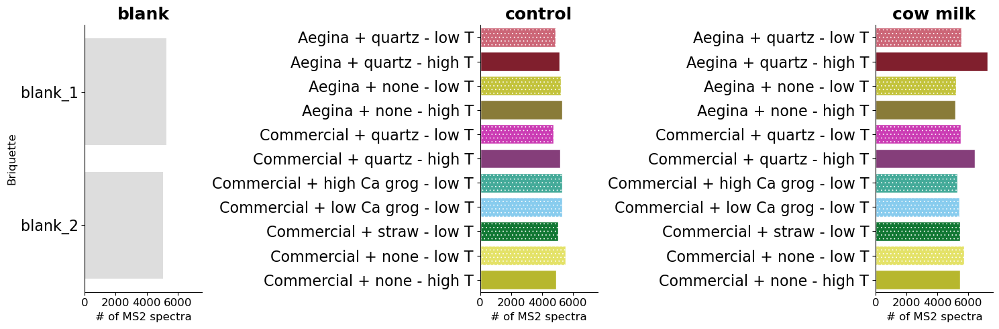

In [66]:
p1 = sns.catplot(
    exp_design, y='label', x='n_ms2scans', col='cooking',
    hue='label', palette=briquette_colors, legend='brief',
    kind='bar', sharey=False, legend_out=True,
    orient='h', saturation=1)

p1.set_titles(col_template="{col_name}", fontweight='bold', size=18)
p1.set_ylabels("Briquette", size=12)
p1.set_xlabels("# of MS2 spectra", size=12)
p1.fig.set_figwidth(15,10)

for i in range(len(p1.axes[0,1].patches)):
    p1.axes[0,1].patches[i].set_hatch(fabric_hatch[hatches[i]])
    p1.axes[0,1].patches[i].set_hatch_linewidth(0.5)
    p1.axes[0,1].patches[i].set_edgecolor('white')
    p1.axes[0,2].patches[i].set_hatch(fabric_hatch[hatches[i]])
    p1.axes[0,2].patches[i].set_hatch_linewidth(0.5)
    p1.axes[0,2].patches[i].set_edgecolor('white')

p1.axes[0,0].set_yticklabels(p1.axes[0,0].get_yticklabels(), size=16)
p1.axes[0,1].set_yticklabels(p1.axes[0,1].get_yticklabels(), size=16)
p1.axes[0,2].set_yticklabels(p1.axes[0,2].get_yticklabels(), size=16)

p1.axes[0,0].set_xticklabels(p1.axes[0,0].get_xticklabels(), size=12)
p1.axes[0,1].set_xticklabels(p1.axes[0,1].get_xticklabels(), size=12)
p1.axes[0,2].set_xticklabels(p1.axes[0,2].get_xticklabels(), size=12)


# p1.axes[0,0].set_xticklabels(p1.axes[0,0].get_xticklabels(), rotation=40, ha='right', rotation_mode="anchor")
# p1.axes[0,1].set_xticklabels(p1.axes[0,1].get_xticklabels(), rotation=40, ha='right', rotation_mode="anchor")
# p1.axes[0,2].set_xticklabels(p1.axes[0,2].get_xticklabels(), rotation=40, ha='right', rotation_mode="anchor")

# export_legend(p1.legend, os.path.join(save_folder, 'briquettes_legends'))
# p1.axes[0,2].legend(loc='center left', bbox_to_anchor=(1, 0.5))
p1.legend.remove()
p1.fig.tight_layout()
p1.fig.savefig(save_folder + '/n_ms2_spectra.png')




In [13]:
psm_data = milk_st.read(n_procs=1, save_path=None, remove_contams=False, remove_decoy=False, fdr_threshold=None)

	Reading sample control_3B ... Done
	Reading sample milk_1B ... Done
	Reading sample milk_7A ... Done
	Reading sample milk_1A ... Done
	Reading sample control_2A ... Done
	Reading sample control_3A ... Done
	Reading sample milk_8B ... Done
	Reading sample control_5A ... Done
	Reading sample control_8B ... Done
	Reading sample control_1A ... Done
	Reading sample control_6A ... Done
	Reading sample milk_3A ... Done
	Reading sample milk_2B ... Done
	Reading sample control_7A ... Done
	Reading sample blank_1 ... Done
	Reading sample milk_3B ... Done
	Reading sample milk_8A ... Done
	Reading sample control_1B ... Done
	Reading sample milk_5A ... Done
	Reading sample blank_2 ... Done
	Reading sample milk_6A ... Done
	Reading sample control_8A ... Done
	Reading sample milk_2A ... Done
	Reading sample control_2B ... Done
Could not extract PTM from Mod1: Loss of O2; nitro photochemical decomposition (Theoretical: 12.9952)
Could not extract PTM from Mod1: Loss of O2; nitro photochemical decompos

<Axes: xlabel='hyperscore', ylabel='Count'>

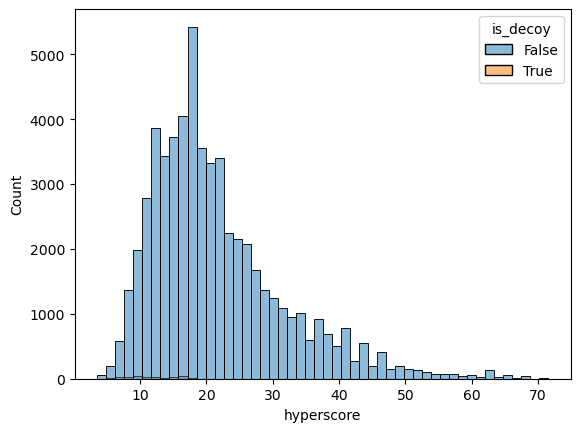

In [14]:
sns.histplot(psm_data, x='hyperscore', hue='is_decoy', stat='count', bins=50)

In [15]:
psm_data = psm_data.merge(exp_design, on='sample', how='left')

In [16]:
psm_data_w_contams = filter_psms(psm_data, remove_contams=None, remove_decoy=True, fdr_threshold=0.05)
psm_data = filter_psms(psm_data, remove_contams=contams_dict, remove_decoy=True, fdr_threshold=0.05)

In [17]:
# Rejoin LACB variants
psm_data.loc[psm_data['prot_id'].isin(lacb), 'prot_id'] = 'sp|P02754|LACB_BOVIN'
psm_data['protein'] = psm_data['prot_id'].map(gene_descr, na_action='ignore')

In [18]:
psm_data_bysample = psm_data.groupby('sample')
psm_data_by_sample_prot = psm_data.groupby(['sample', 'protein'])

psm_data_bysample_w_contams = psm_data_w_contams.groupby('sample')


## Summarise number of PSMs per sample and protein

### By sample

In [19]:
def summarise_psms(psm_df):
    prop = 100 * psm_df.shape[0]/psm_df.iloc[0]
    return prop

ids_per_sample_w_contams = (
    psm_data_bysample_w_contams['n_ms2scans']
    .aggregate('count').reset_index()
    .rename(columns={'n_ms2scans': 'count_ids'})
    .merge(exp_design, on='sample', how='left')
    .sort_values('sample')
)
ids_per_sample_w_contams['prop_ids'] = ids_per_sample_w_contams['count_ids'] / ids_per_sample_w_contams['n_ms2scans']


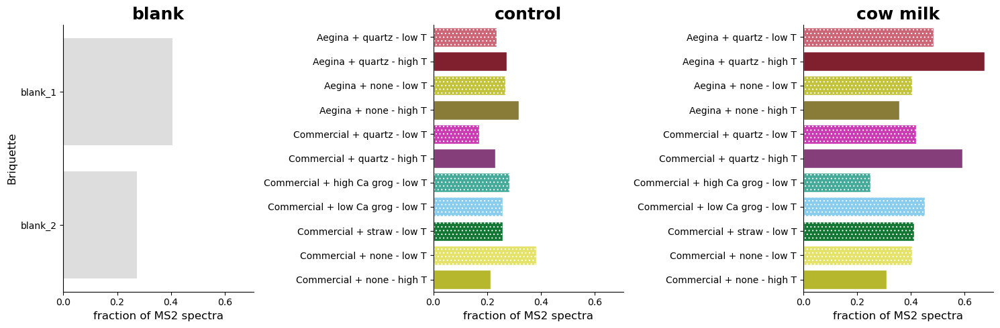

In [69]:
p2 = sns.catplot(
    ids_per_sample_w_contams,
    y='label', x='prop_ids', col='cooking', hue='label',
    palette=briquette_colors, orient='h', saturation=1,
    kind='bar', sharey=False, legend_out=True)
p2.set_titles(col_template="{col_name}", fontweight='bold', size=18)
p2.set_ylabels("Briquette", size=12)
p2.set_xlabels("fraction of MS2 spectra", size=12)
p2.fig.set_figwidth(15,10)

for i in range(len(p2.axes[0,1].patches)):
    p2.axes[0,1].patches[i].set_hatch(fabric_hatch[hatches[i]])
    p2.axes[0,1].patches[i].set_hatch_linewidth(0.8)
    p2.axes[0,1].patches[i].set_edgecolor('white')
    p2.axes[0,2].patches[i].set_hatch(fabric_hatch[hatches[i]])
    p2.axes[0,2].patches[i].set_hatch_linewidth(0.8)
    p2.axes[0,2].patches[i].set_edgecolor('white')

# export_legend(p2.legend, os.path.join(save_folder, 'briquettes_legends'))
# p2.axes[0,2].legend(loc='center left', bbox_to_anchor=(1, 0.5))

p2.fig.tight_layout()
p2.fig.savefig(save_folder + '/ids_spectra_w_contams.png')

In [22]:
ids_per_sample = (
    psm_data_bysample['n_ms2scans']
    .aggregate('count').reset_index()
    .rename(columns={'n_ms2scans': 'count_ids'})
    .merge(exp_design, on='sample', how='left')
    .sort_values('sample')
)
ids_per_sample['prop_ids'] = ids_per_sample['count_ids'] / ids_per_sample['n_ms2scans']
# ids_per_sample

# Add empty row for control Commercial + high Ca grog - low T
# empty  = pd.DataFrame(
#     [['control_5A', 0, np.nan, np.nan,
#       'R', 'Commercial + (R)', 'high Ca grog', 'low T', 'control', 'Commercial + high Ca grog - low T',
#       'Commercial + high Ca grog', 0.0]],
#     columns=['sample', 'count_ids', 'n_ms1scans', 'n_ms2scans', 'clay', 'clay_name', 'temper', 'firing',
#              'cooking', 'label', 'fabric', 'prop_ids']
# )
# ids_per_sample = (pd.concat([ids_per_sample, empty])
#                   .sort_values('sample')
#                   .reset_index(drop=True))

/tmp/ipykernel_26854/1823506387.py:11: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  p3.axes[0,0].set_yticklabels(p3.axes[0,0].get_yticklabels(), size=16)
/tmp/ipykernel_26854/1823506387.py:12: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  p3.axes[0,1].set_yticklabels(p3.axes[0,1].get_yticklabels(), size=16)
/tmp/ipykernel_26854/1823506387.py:13: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  p3.axes[0,2].set_yticklabels(p3.axes[0,2].get_yticklabels(), size=16)
/tmp/ipykernel_26854/1823506387.py:15: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  p3.axes[0,0].set_xticklabels(p3.axes[0,0].get_xticklabels(), size=14)
/tmp/ipykernel_26854/1823506387.py:16: UserW

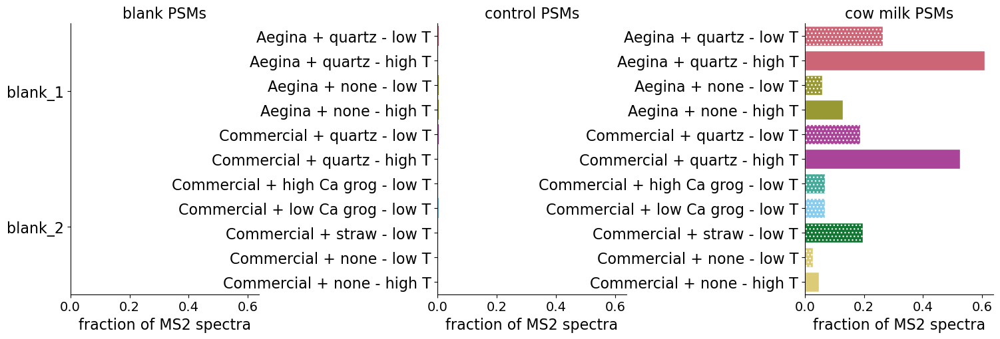

In [23]:
p3 = sns.catplot(
    ids_per_sample,
    y='label', x='prop_ids', col='cooking', hue='label',
    palette=briquette_colors, orient='h', legend=False,
    kind='bar', sharey=False, legend_out=True, saturation=1)
p3.set_titles(col_template="{col_name} PSMs", size=16)
p3.set_ylabels("", size=12)
p3.set_xlabels("fraction of MS2 spectra", size=16)
p3.fig.set_figwidth(15)

p3.axes[0,0].set_yticklabels(p3.axes[0,0].get_yticklabels(), size=16)
p3.axes[0,1].set_yticklabels(p3.axes[0,1].get_yticklabels(), size=16)
p3.axes[0,2].set_yticklabels(p3.axes[0,2].get_yticklabels(), size=16)

p3.axes[0,0].set_xticklabels(p3.axes[0,0].get_xticklabels(), size=14)
p3.axes[0,1].set_xticklabels(p3.axes[0,1].get_xticklabels(), size=14)
p3.axes[0,2].set_xticklabels(p3.axes[0,2].get_xticklabels(), size=14)


for i in range(len(p3.axes[0,2].patches)):
    p3.axes[0,2].patches[i].set_hatch(fabric_hatch[hatches[i]])
    p3.axes[0,2].patches[i].set_hatch_linewidth(1)
    p3.axes[0,2].patches[i].set_edgecolor('white')

/tmp/ipykernel_26854/3947840088.py:11: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  p3.axes[0,0].set_yticklabels(p3.axes[0,0].get_yticklabels(), size=16)
/tmp/ipykernel_26854/3947840088.py:12: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  p3.axes[0,0].set_xticklabels(p3.axes[0,0].get_xticklabels(), size=14)


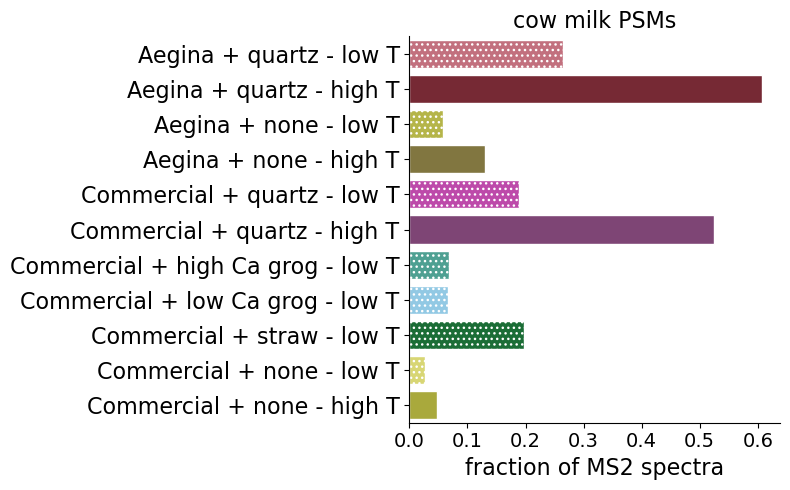

In [75]:
p3 = sns.catplot(
    ids_per_sample.query('cooking=="cow milk"'),
    y='label', x='prop_ids', col='cooking', hue='label',
    palette=briquette_colors, orient='h', legend=False,
    kind='bar', sharey=False, legend_out=True, saturation=0.8)
p3.set_titles(col_template="{col_name} PSMs", size=16)
p3.set_ylabels("", size=12)
p3.set_xlabels("fraction of MS2 spectra", size=16)
p3.fig.set_figwidth(8)

p3.axes[0,0].set_yticklabels(p3.axes[0,0].get_yticklabels(), size=16)
p3.axes[0,0].set_xticklabels(p3.axes[0,0].get_xticklabels(), size=14)


for i in range(len(p3.axes[0,0].patches)):
    p3.axes[0,0].patches[i].set_hatch(fabric_hatch[hatches[i]])
    p3.axes[0,0].patches[i].set_hatch_linewidth(1)
    p3.axes[0,0].patches[i].set_edgecolor('white')



p3.fig.tight_layout()
p3.fig.savefig(save_folder + '/ids_spectra.png', format='png')
p3.fig.savefig(save_folder + '/ids_spectra.svg', format='svg')

### By sample and milk protein

In [27]:
ids_per_sample_prot = (
    psm_data_by_sample_prot['n_ms2scans']
    .aggregate(summarise_psms).reset_index()
    .rename(columns={'n_ms2scans': 'prop_ids'})
    .merge(exp_design, on='sample', how='left')
    .query('cooking in ["cow milk"]')
    .sort_values(['sample','protein'])
)
prot_order = ids_per_sample_prot['protein'].drop_duplicates().sort_values()


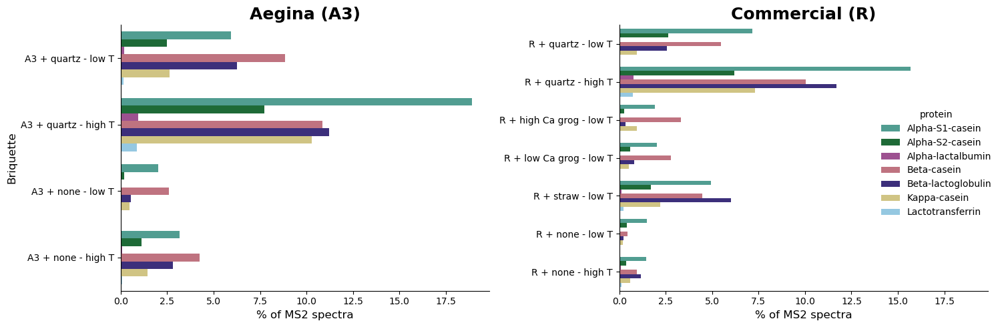

In [103]:

p4 = sns.catplot(
    ids_per_sample_prot, y='label', x='prop_ids', kind='bar', hue='protein', palette=protein_colors,
    col='clay_name', orient='h',
    sharex=True, sharey=False, legend_out=True, hue_order=prot_order)
p4.set_titles(col_template="{col_name}", row_template="{row_name}", fontweight='bold', size=18)
p4.fig.set_figwidth(15, 8)
p4.set_ylabels("Briquette", size=12)
p4.set_xlabels("% of MS2 spectra", size=12)
# p4.axes[0,0].set_xticklabels(p4.axes[0,0].get_xticklabels(), size=16)
# p4.axes[1,0].set_xticklabels(p4.axes[1,0].get_xticklabels(), size=16, rotation=40, ha='right', rotation_mode="anchor")
export_legend(p4.legend, os.path.join(save_folder, 'proteins_legend'))
# p4.axes[0,1].legend(loc='center left', bbox_to_anchor=(1, 0.5))
# p4.legend.remove()
p4.fig.tight_layout()
p4.fig.savefig(save_folder + '/n_psms_prot.png')

In [28]:
protein_df = (
    protein_df
    .query('`Protein Description` in @protein_colors and cooking in ["cow milk"]')
)

# Other proteins axes hatches
ax0hatches = [
    '1A',  '1A',  '1A',
    '1B',  '1B',  '1B',
    '2A',  '2A',
    '2B', '2B', '2B',
    '3A', '3A',
    '3B', '3B', '3B',
    '5A',  '5A',
    '6A',  '6A',
    '7A',  '7A',  '7A',
    '8A',
    '8B', '8B', '8B'
          ]
ax1hatches = []
for h in hatches:
    h = [h] * 4
    ax1hatches.extend(h)
ax1hatches.extend(hatches)

/tmp/ipykernel_26854/120579817.py:11: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  p5.axes[0,0].set_yticklabels(p5.axes[0,0].get_yticklabels(), size=16)
/tmp/ipykernel_26854/120579817.py:12: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  p5.axes[0,1].set_yticklabels(p5.axes[0,1].get_yticklabels(), size=16)
/tmp/ipykernel_26854/120579817.py:14: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  p5.axes[0,0].set_xticklabels(p5.axes[0,0].get_xticklabels(), size=12)
/tmp/ipykernel_26854/120579817.py:15: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  p5.axes[0,1].set_xticklabels(p5.axes[0,1].get_xticklabels(), size=12)


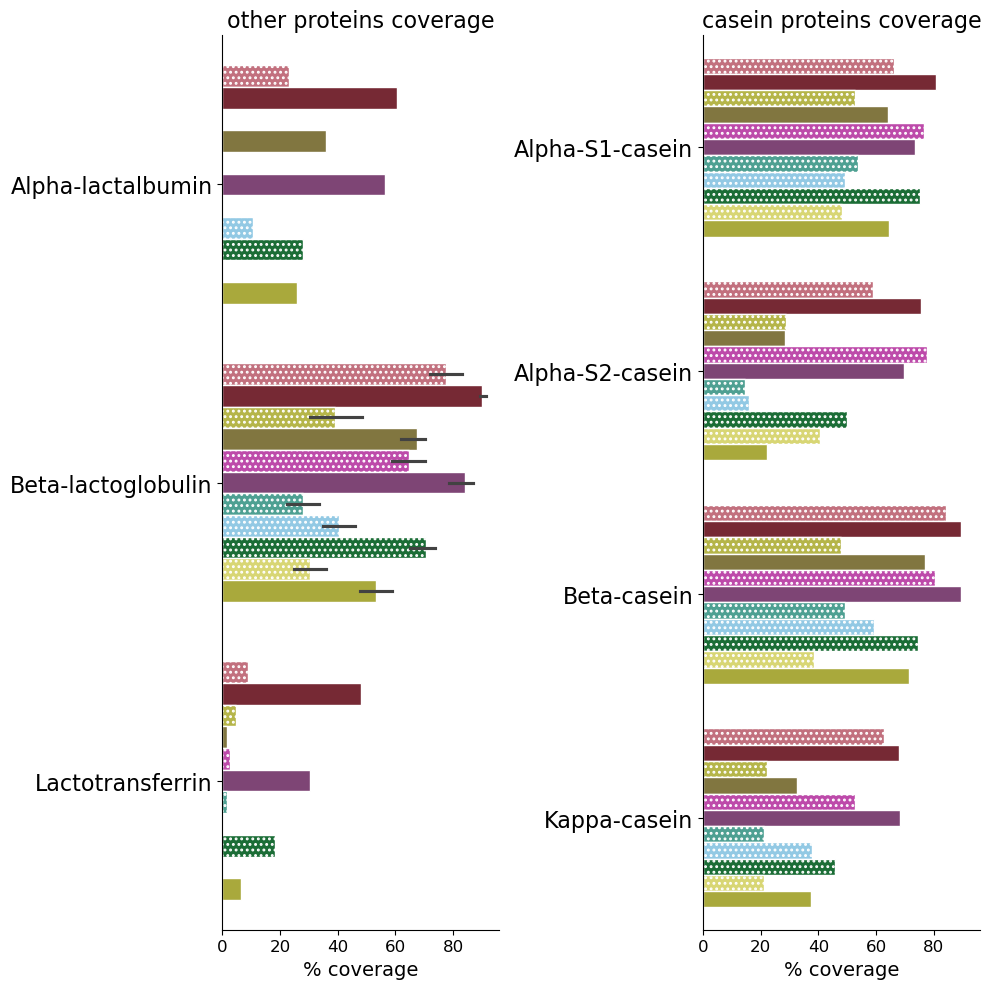

In [76]:
p5 = sns.catplot(
    protein_df, y='Protein Description', x='Coverage', kind='bar', hue='label', palette=briquette_colors,
    orient='h', col='protein_group', saturation=0.8,
    sharex=True, sharey=False, legend_out=True)
p5.set_titles(col_template="{col_name} proteins coverage", row_template="{row_name}", size=16)
p5.fig.set_figwidth(10)
p5.fig.set_figheight(10)
p5.set_ylabels("", size=12)
p5.set_xlabels("% coverage", size=14)

p5.axes[0,0].set_yticklabels(p5.axes[0,0].get_yticklabels(), size=16)
p5.axes[0,1].set_yticklabels(p5.axes[0,1].get_yticklabels(), size=16)

p5.axes[0,0].set_xticklabels(p5.axes[0,0].get_xticklabels(), size=12)
p5.axes[0,1].set_xticklabels(p5.axes[0,1].get_xticklabels(), size=12)


for i in range(len(p5.axes[0,0].patches)):
    p5.axes[0,0].patches[i].set_hatch(fabric_hatch[ax0hatches[i]])
    p5.axes[0,0].patches[i].set_hatch_linewidth(1.3)
    p5.axes[0,0].patches[i].set_edgecolor('white')

for i in range(len(p5.axes[0,1].patches)):
    p5.axes[0,1].patches[i].set_hatch(fabric_hatch[ax1hatches[i]])
    p5.axes[0,1].patches[i].set_hatch_linewidth(1.3)
    p5.axes[0,1].patches[i].set_edgecolor('white')

p5.axes[0,1].legend(loc='center left', bbox_to_anchor=(1, 0.5))
p5.legend.remove()
export_legend(p5.axes[0,1].get_legend(), os.path.join(save_folder, 'briquettes_legend'))
p5.axes[0,1].get_legend().remove()
p5.fig.tight_layout()
p5.fig.savefig(save_folder + '/coverage_prot_2.png', format='png')
p5.fig.savefig(save_folder + '/coverage_prot_2.svg', format='svg')

## Summarise PTMs per sample and protein

In [28]:
def summarise_ptms(psm_df):
    n_psms = psm_df.shape[0]
    n_ms2 = psm_df['n_ms2scans'].iloc[0]
    counts = psm_df.value_counts('delta_mass_mods')
    if counts.shape[0] == 1:
        return None
    counts_df = pd.DataFrame(
        {'count': counts,
         'prop_psms': counts*100 / n_psms,
         'prop_ms2': counts*100 / n_ms2}
    )
    counts_df = counts_df.sort_values('count', ascending=False).iloc[0:5,:]
    return counts_df


ptms_by_sample = (
    psm_data_bysample
    .apply(summarise_ptms, include_groups=False)
    .reset_index()
    .merge(exp_design, on='sample', how='left'))
milk_ptms_by_sample = ptms_by_sample.query('cooking == "cow milk"')
milk_mainptms_by_sample = ptms_by_sample.query('delta_mass_mods in @main_ptms')

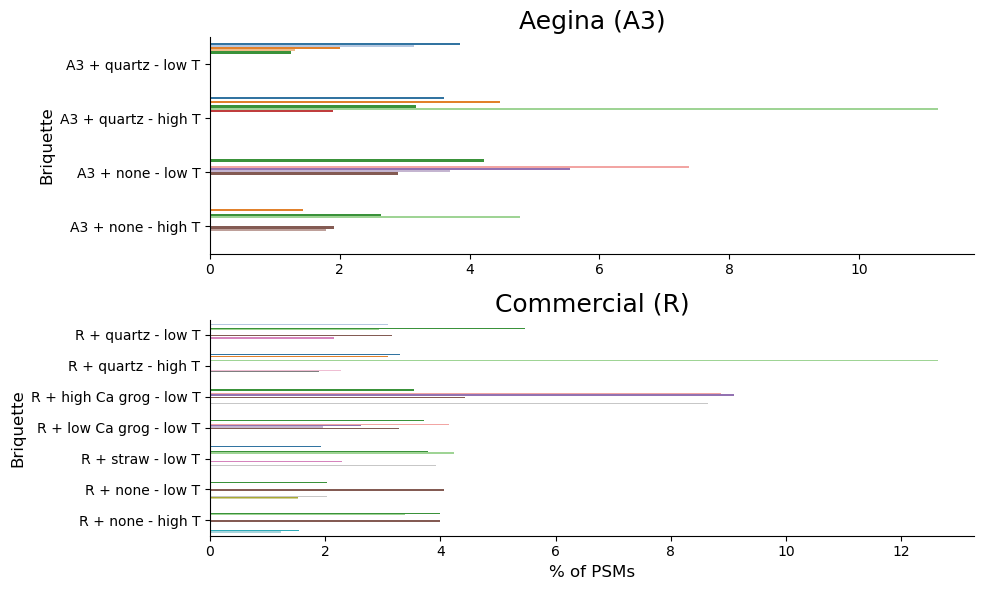

In [61]:
# do a combined plot just to get a combined legend
p6 = sns.catplot(
    milk_ptms_by_sample,
    y='label', x='prop_psms', hue='delta_mass_mods', orient='h',
    kind='bar', palette='tab20', row='clay_name',
    sharey=False, sharex=False, legend_out=True)

p6.set_titles(col_template="{col_name}", row_template="{row_name}", size=18)
p6.fig.set_figwidth(10)
p6.fig.set_figheight(6)
p6.set_ylabels("Briquette", size=12)
p6.set_xlabels("% of PSMs", size=12)
# p6.axes[0,0].set_xticklabels(p4.axes[0,0].get_xticklabels(), size=14)
# p6.axes[1,0].set_xticklabels(p4.axes[1,0].get_xticklabels(), size=14, rotation=40, ha='right', rotation_mode="anchor")
p6.fig.tight_layout()
export_legend(p6.legend, os.path.join(save_folder, 'all_ptms_legend'))
p6.legend.remove()

# p6.fig.savefig(save_foldeCommercial + '/all_ptms.png')

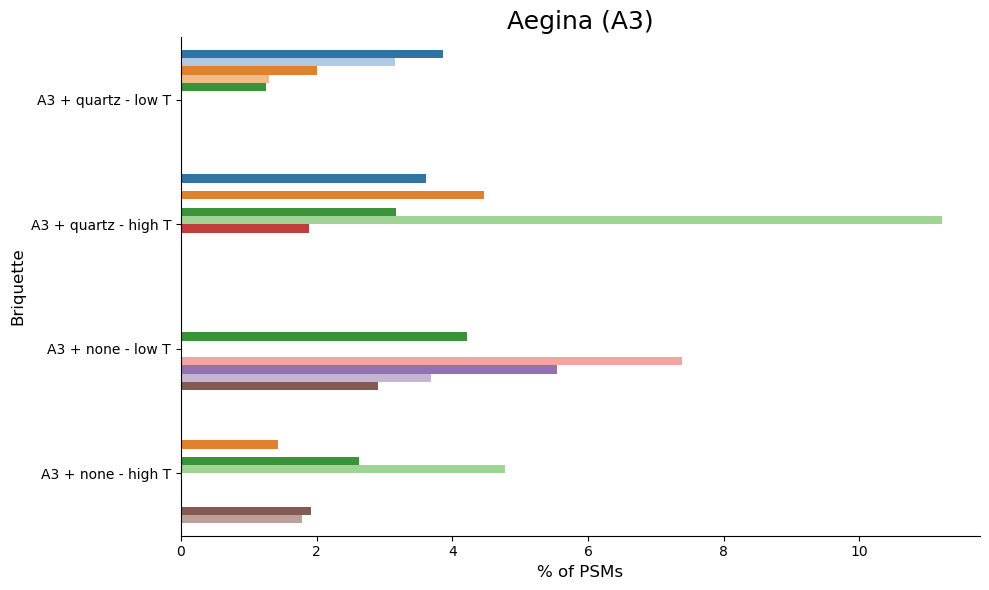

In [62]:
p6_1 = sns.catplot(
    milk_ptms_by_sample.query('clay == "Aegina"'),
    y='label', x='prop_psms', hue='delta_mass_mods', orient='h',
    kind='bar', palette='tab20', row='clay_name',
    sharey=False, sharex=False, legend_out=True)

p6_1.set_titles(col_template="{col_name}", row_template="{row_name}", size=18)
p6_1.fig.set_figwidth(10)
p6_1.fig.set_figheight(6)
p6_1.set_ylabels("Briquette", size=12)
p6_1.set_xlabels("% of PSMs", size=12)
# p6.axes[0,0].set_xticklabels(p4.axes[0,0].get_xticklabels(), size=14)
# p6.axes[1,0].set_xticklabels(p4.axes[1,0].get_xticklabels(), size=14, rotation=40, ha='right', rotation_mode="anchor")
# export_legend(p6.legend, os.path.join(save_folder, 'all_ptms_legend'))
# p6.axes[0,1].legend(loc='center left', bbox_to_anchor=(1, 0.5))
p6_1.legend.remove()
p6_1.fig.tight_layout()
p6_1.fig.savefig(save_folder + '/all_ptms_Aegina.png')

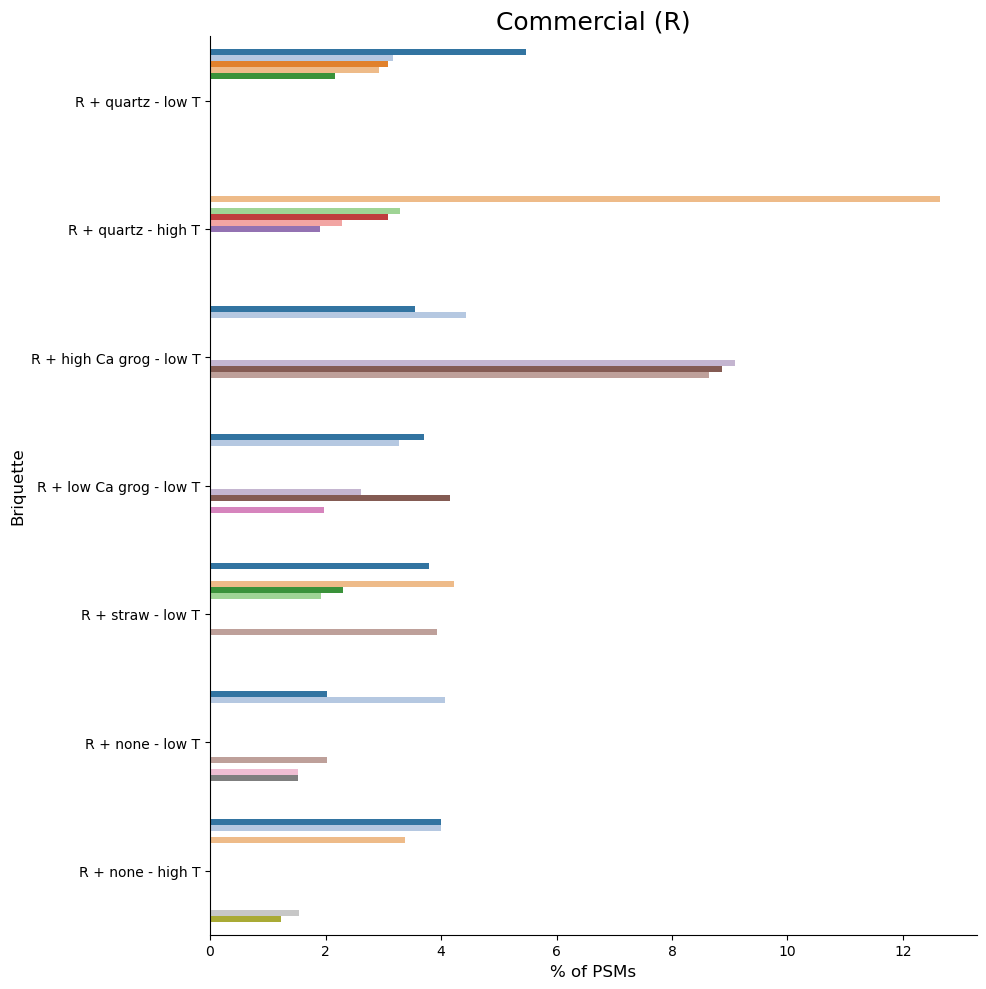

In [63]:
p6_2 = sns.catplot(
    milk_ptms_by_sample.query('clay == "R"'),
    y='label', x='prop_psms', hue='delta_mass_mods', orient='h',
    kind='bar', palette='tab20', row='clay_name',
    sharey=False, sharex=False, legend_out=True)

p6_2.set_titles(col_template="{col_name}", row_template="{row_name}", size=18)
p6_2.fig.set_figwidth(10)
p6_2.fig.set_figheight(10)
p6_2.set_ylabels("Briquette", size=12)
p6_2.set_xlabels("% of PSMs", size=12)
# p6.axes[0,0].set_xticklabels(p4.axes[0,0].get_xticklabels(), size=14)
# p6.axes[1,0].set_xticklabels(p4.axes[1,0].get_xticklabels(), size=14, rotation=40, ha='right', rotation_mode="anchor")
# export_legend(p7.axes[0,0].get_legend(), os.path.join(save_folder, 'all_ptms_legend'))
# p6.axes[0,1].legend(loc='center left', bbox_to_anchor=(1, 0.5))
p6_2.legend.remove()
p6_2.fig.tight_layout()
p6_2.fig.savefig(save_folder + '/all_ptms_R.png')

### Focus on Lactosylation and Phosphorilation

In [29]:
ptms_by_sample_prot = (
    psm_data_by_sample_prot
    .apply(summarise_ptms, include_groups=False)
    .reset_index()
    .merge(exp_design, on='sample', how='left'))
keep_samples = ['milk_1B', 'milk_2B', 'milk_3B', 'milk_8B']
lacto_by_sample_prot = ptms_by_sample_prot.query('delta_mass_mods == "Lactosylation"')
phospho_by_sample_prot = ptms_by_sample_prot.query('delta_mass_mods == "Phosphorylation"')
pl_by_sample_prot = ptms_by_sample_prot.query('delta_mass_mods in ["Phosphorylation", "Lactosylation"]')

/tmp/ipykernel_9523/3645460510.py:12: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  p7_1.axes[0,0].set_yticklabels(p7_1.axes[0,0].get_yticklabels(), size=16)


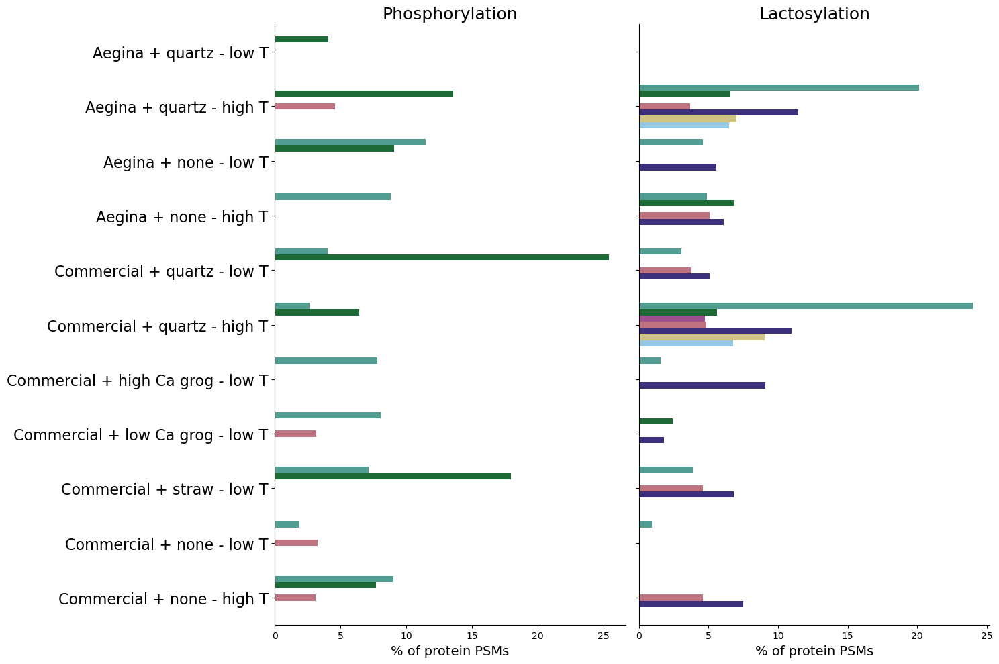

In [33]:
p7_1 = sns.catplot(
    pl_by_sample_prot, y='label', x='prop_psms', hue='protein', kind='bar',
    orient='h', margin_titles=True,
    hue_order=prot_order,
    palette=protein_colors, col='delta_mass_mods', sharey=True, sharex=False, legend_out=True)

p7_1.set_titles(col_template="{col_name}", row_template="", size=18)
p7_1.fig.set_figwidth(15)
p7_1.fig.set_figheight(10)
p7_1.set_ylabels("", size=12)
p7_1.set_xlabels("% of protein PSMs", size=14)
p7_1.axes[0,0].set_yticklabels(p7_1.axes[0,0].get_yticklabels(), size=16)
# p7_1.axes[0,1].legend(loc='center left', bbox_to_anchor=(1, 0.5))
export_legend(p7_1.legend, os.path.join(save_folder, 'main_ptms_legend'))
p7_1.legend.remove()
p7_1.fig.tight_layout()
p7_1.fig.savefig(save_folder + '/phospho_lacto_sample_prot.png', format='png')
p7_1.fig.savefig(save_folder + '/phospho_lacto_sample_prot.svg', format='svg')

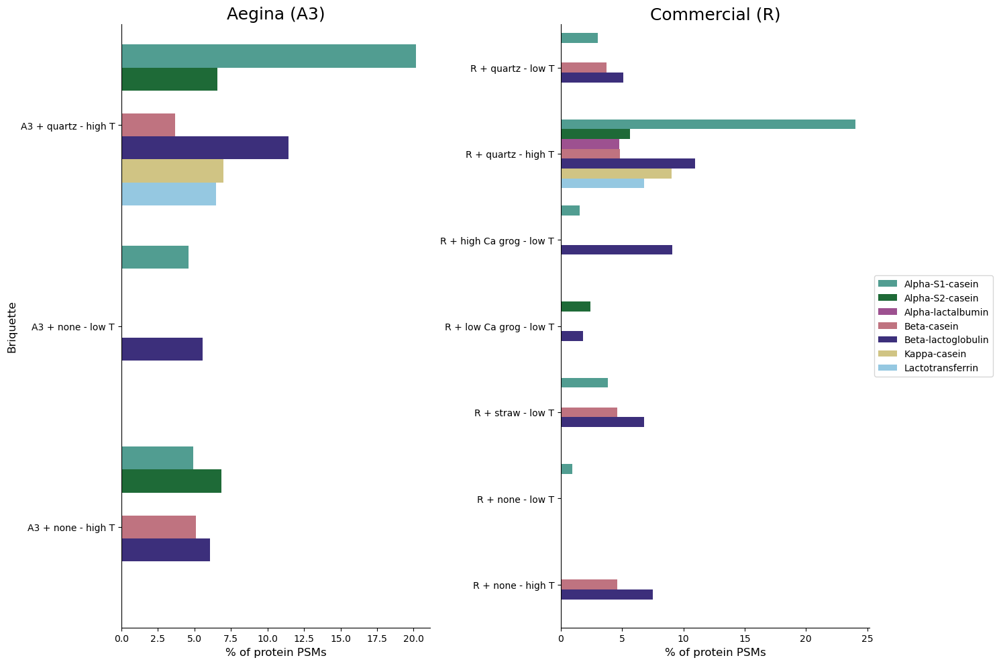

In [78]:
p7 = sns.catplot(lacto_by_sample_prot, y='label', x='prop_psms', hue='protein', kind='bar',
                 orient='h',
                 hue_order=prot_order,
                 palette=protein_colors, col='clay_name', sharey=False, sharex=False, legend_out=True)

p7.set_titles(col_template="{col_name}", row_template="{row_name}", size=18)
p7.fig.set_figwidth(15)
p7.fig.set_figheight(10)
p7.set_ylabels("Briquette", size=12)
p7.set_xlabels("% of protein PSMs", size=12)
# p7.axes[0,0].set_xticklabels(p7.axes[0,0].get_xticklabels(), size=14)
# p7.axes[1,0].set_xticklabels(p7.axes[1,0].get_xticklabels(), size=14, rotation=40, ha='right', rotation_mode="anchor")
# export_legend(p7.legend, os.path.join(save_folder, 'main_ptms_legend'))
p7.axes[0,1].legend(loc='center left', bbox_to_anchor=(1, 0.5))
p7.legend.remove()
p7.fig.tight_layout()
p7.fig.savefig(save_folder + '/lacto_sample_prot.png')

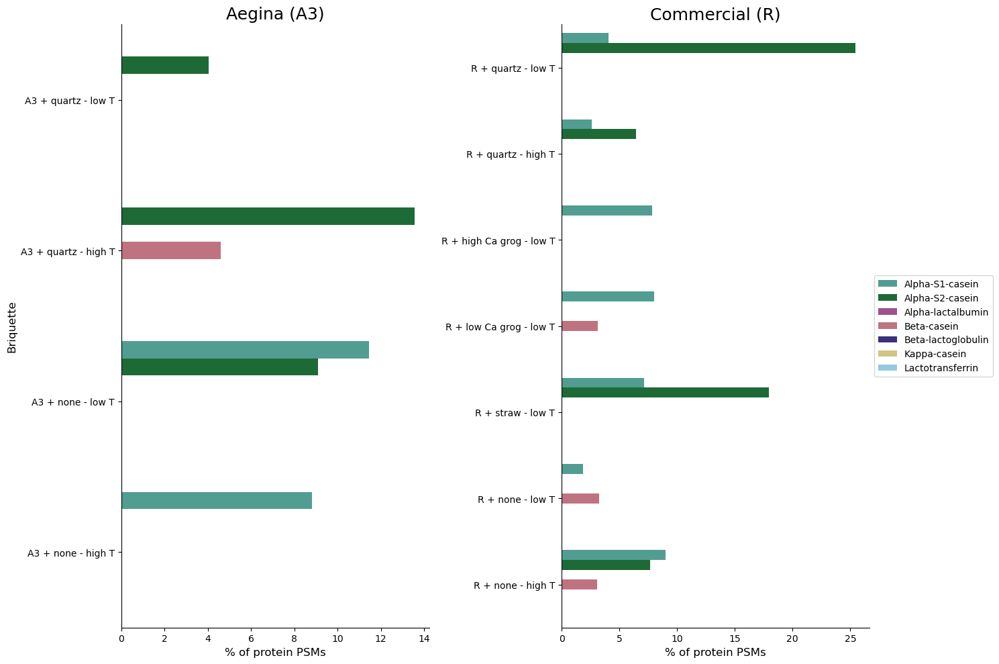

In [79]:
p8 = sns.catplot(phospho_by_sample_prot, y='label', x='prop_psms', hue='protein', kind='bar',
                 orient='h',
                 hue_order=prot_order,
                 palette=protein_colors, col='clay_name', sharey=False, sharex=False, legend_out=True)

p8.set_titles(col_template="{col_name}", row_template="{row_name}", size=18)
p8.fig.set_figwidth(15)
p8.fig.set_figheight(10)
p8.set_ylabels("Briquette", size=12)
p8.set_xlabels("% of protein PSMs", size=12)
# p7.axes[0,0].set_xticklabels(p7.axes[0,0].get_xticklabels(), size=14)
# p7.axes[1,0].set_xticklabels(p7.axes[1,0].get_xticklabels(), size=14, rotation=40, ha='right', rotation_mode="anchor")
# export_legend(p7.legend, os.path.join(save_folder, 'main_ptms_legend'))
p8.axes[0,1].legend(loc='center left', bbox_to_anchor=(1, 0.5))
p8.legend.remove()
p8.fig.tight_layout()
p8.fig.savefig(save_folder + '/lacto_sample_prot.png')

## Unique peptides Venn

In [26]:
set1A = set(psm_data.query('sample == "milk_1A"').Seq)
set1B = set(psm_data.query('sample == "milk_1B"').Seq)
set2A = set(psm_data.query('sample == "milk_2A"').Seq)
set2B = set(psm_data.query('sample == "milk_2B"').Seq)
set3A = set(psm_data.query('sample == "milk_3A"').Seq)
set3B = set(psm_data.query('sample == "milk_3B"').Seq)


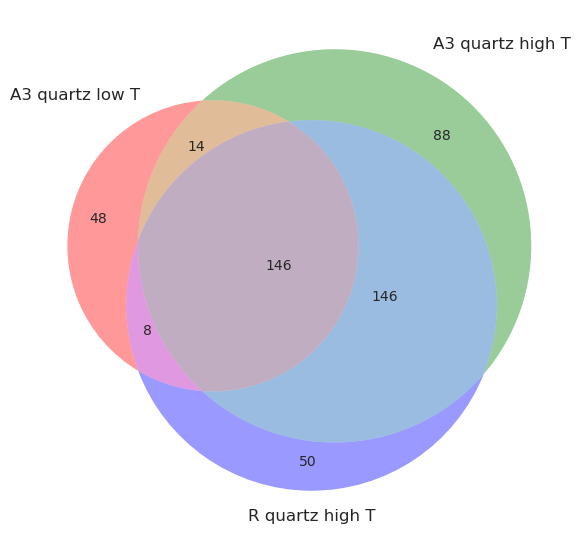

In [27]:
venn_fig_1, ax_venn_1 = plt.subplots(1, 1, figsize=(7, 7))
venn3([set1A, set1B, set3B],
      set_labels=[
          'Aegina quartz low T',
          'Aegina quartz high T',
          'R quartz high T'], ax=ax_venn_1)

venn_fig_1.savefig(os.path.join(save_folder, 'venn_fig_1.png'), format='png', dpi=400)

In [ ]:
peptides = from_contents(
    {'Aegina quartz low T': set1A, 'Aegina quartz high T': set1B,
     'Aegina none low T': set2A,   'Aegina none high T': set2B,
     'Commercial + quartz low T': set3A,   'Commercial + quartz high T': set3B})
UpSet(peptides, subset_size="count").plot()

# Plot position data

In [77]:
def get_weights(m):
    m = np.array(m)
    w = m > 0.5
    tot = np.sum(w)
    if tot == 0:
        return np.zeros(m.shape[0])
    else:
        return w / tot
def get_psm_delta_mass(m):
    m = np.array(m)
    m = m[m>0.5]
    if len(m) == 0:
        return 0
    else:
        return m[0]
psm_long = psm_data.query('cooking=="cow milk"').copy()
psm_long['delta_mass_mods_weights'] = psm_long['delta_mass_pos'].apply(get_weights)
psm_long['delta_mass'] = psm_long['delta_mass_pos'].apply(get_psm_delta_mass)


In [ ]:
psm_long = psm_to_long(psm_long)

In [79]:
psm_long['ptm_counts'] = psm_long['count'] * psm_long['delta_mass_mods_weights']

In [ ]:
int_fig_1 = px.bar(
    psm_long.query('prot_id == "sp|P02754|LACB_BOVIN"'),
    x="pep_positions", y="count", color="pep_letters", title="BLG coverage",
    facet_row='label', width=1500, height=1500, hover_data=['delta_mass_mod1_pos'],
)
int_fig_1.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
int_fig_1.show()

## BLG coverage non-interactive

In [80]:
psm_long_blg = psm_long.query('prot_id == "sp|P02754|LACB_BOVIN"').copy()
psm_long_blg = psm_long_blg.groupby(['label', 'pep_positions'])['count'].agg('sum').reset_index()
# psm_long_blg['max_count'] = psm_long_blg.groupby('label')['count'].transform('max')
# psm_long_blg['norm_count'] = psm_long_blg['count'] / psm_long_blg['max_count']

blg_range = np.arange(1,psm_long_blg['pep_positions'].max() + 1)

In [81]:
blg_seq = record_dict['sp|P02754A|LACB_BOVIN'].seq
tryptic_sites = [pos+1 for pos, aa in enumerate(blg_seq) if aa == 'K' or aa == 'R']
lactosylated_sites = [63, 91, 93, 107, 151, 154]

In [82]:
def fill_empty_pos(df):
    count = np.zeros(len(blg_range))
    # count[:] = np.nan
    count[df['pep_positions']-1] = df['count']
    return pd.DataFrame({'pep_positions':blg_range, 'count':count})

psm_long_blg = (
    psm_long_blg
    .groupby('label')
    .apply(fill_empty_pos, include_groups=False)
    .reset_index().drop(columns='level_1'))


In [83]:
psm_long_blg = psm_long_blg.merge(
    exp_design[exp_design['cooking'] == 'cow milk'],
    on='label', how='left')

psm_long_blg = psm_long_blg.replace(
    {'fabric': {
        'Commercial + high Ca grog': 'Commercial + high Ca grog - low T',
        'Commercial + low Ca grog': 'Commercial + low Ca grog - low T',
        'Commercial + straw': 'Commercial + straw - low T'
    }}
)

psm_long_blg.loc[psm_long_blg['count'] == 0.0, 'count'] = -20


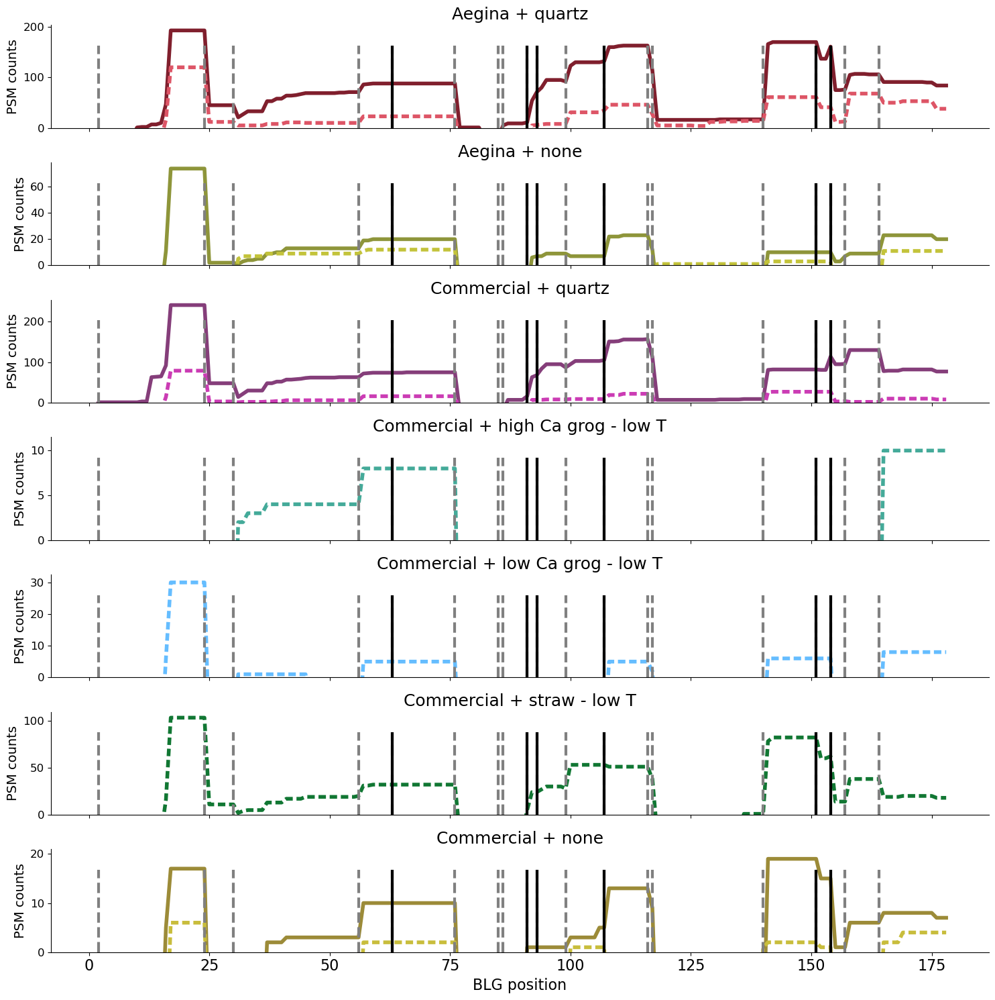

In [90]:
dashes = {
    'low T': (2,1),
    'high T': ''
}


briquette_colors = {
    'Aegina + quartz - low T': '#DD5566', 
    'Aegina + quartz - high T': '#801f2d',
    'Aegina + none - low T': '#c3c33b',
    'Aegina + none - high T': '#8e953a',
    'Commercial + quartz - low T': '#cb3cb4',
    'Commercial + quartz - high T': '#853e7a',
    'Commercial + high Ca grog - low T': '#44AA99',
    'Commercial + low Ca grog - low T': '#65bdff', #88CCFF
    'Commercial + straw - low T': '#117733',
    'Commercial + none - low T': '#c8bd3c',
    'Commercial + none - high T': '#9c8b38',
    'empty': '#dddddd'
}


row_order = [
    'Aegina + quartz',
    'Aegina + none',
    'Commercial + quartz',
    'Commercial + high Ca grog - low T',
    'Commercial + low Ca grog - low T',
    'Commercial + straw - low T',
    'Commercial + none'
]


p_cov = sns.relplot(
    psm_long_blg, x='pep_positions', y='count', row='fabric', kind='line',
    hue='label', palette=briquette_colors,
    style='firing', dashes=dashes, lw=4, legend=False,
    row_order=row_order, facet_kws={'sharey':False, 'legend_out':True}
)

for i in range(p_cov.axes.shape[0]):
    ax = p_cov.axes[i,0]
    ax.set_ylim(0,None)
    ax_ylim = ax.get_ylim()
    ax.vlines(
        tryptic_sites, ymin=ax_ylim[0], ymax=0.8*ax_ylim[1],
        linestyles='dashed', color='grey', label='tryptic',
        linewidth=3
    )
    ax.vlines(
        lactosylated_sites, ymin=ax_ylim[0], ymax=0.8*ax_ylim[1],
        linestyles='solid', color='black', label='lactosylated',
        linewidth=3
    )
    

# p_cov = sns.relplot(
#     psm_long_blg, x='pep_positions', y='count', s=200, row='fabric', kind='scatter', hue='label',
#     facet_kws={'sharey':False, 'legend_out':True}, palette=briquette_colors, style='label', markers=markers,
#     row_order=row_order, edgecolors=None
# )

p_cov.set_titles(row_template="{row_name}", size=18)
p_cov.set_ylabels('PSM counts', size=14)
p_cov.set_xlabels('BLG position', size=16)
# p_cov.set_xticklabels(p_cov.get_xticks(), size=25)
p_cov.tick_params('x', labelsize=16)
p_cov.tick_params('y', labelsize=12)
p_cov.fig.set_figwidth(15)
p_cov.fig.set_figheight(15)
p_cov.fig.tight_layout()
p_cov.fig.savefig(save_folder + '/blg_coverage.svg', format='svg')
p_cov.fig.savefig(save_folder + '/blg_coverage.png', format='png')

In [91]:
int_fig_2 = px.bar(
    psm_long.query('prot_id == "sp|P02754|LACB_BOVIN" and (delta_mass_mod1_pos == "Lactosylation" or delta_mass_mod2_pos == "Lactosylation")'),
    x="pep_positions", y="count", color="delta_mass_mod1_pos", title="BLG PTMs",
    facet_row='label', width=1500, height=1500, hover_data=['delta_mass_mod1_pos', 'pep_letters'],
)
int_fig_2.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
int_fig_2.show()

In [ ]:
fig = px.bar(
    psm_long.query('prot_id == "sp|P02662|CASA1_BOVIN"'),
    x="pep_positions", y="count", color="pep_letters", title="CASA1 coverage",
    facet_row='label', width=1500, height=1000
)
fig.show()

In [ ]:
fig = px.bar(
    psm_long.query('prot_id == "sp|P02662|CASA1_BOVIN" and (delta_mass_mod1_pos == "Lactosylation" or delta_mass_mod2_pos == "Lactosylation")'),
    x="pep_positions", y="count", color="pep_letters", title="CASA1 lactosylation",
    facet_row='label', width=1500, height=1000, hover_data=['delta_mass_mod1_pos'],
)
fig.show()

In [ ]:
fig = px.bar(
    psm_long.query('prot_id == "sp|P02663|CASA2_BOVIN"'),
    x="pep_positions", y="count", color="pep_letters", title="CASA2 coverage",
    facet_row='label', width=1500, height=1000
)
fig.show()

In [ ]:
fig = px.bar(
    psm_long.query('prot_id == "sp|P02663|CASA2_BOVIN" and (delta_mass_mod1_pos == "Lactosylation" or delta_mass_mod2_pos == "Lactosylation")'),
    x="pep_positions", y="count", color="pep_letters", title="CASA2 lactosylation",
    facet_row='label', width=1500, height=1000, hover_data=['delta_mass_mod1_pos'],
)
fig.show()

In [ ]:
fig = px.bar(
    psm_long.query('prot_id == "sp|P02666|CASB_BOVIN" and (delta_mass_mod1_pos == "Lactosylation" or delta_mass_mod2_pos == "Lactosylation")'),
    x="pep_positions", y="count", color="pep_letters", title="CASB lactosylation",
    facet_row='label', width=1500, height=1000, hover_data=['delta_mass_mod1_pos'],
)
fig.show()

In [ ]:
fig = px.bar(
    psm_long.query('prot_id == "sp|P02668|CASK_BOVIN" and (delta_mass_mod1_pos == "Lactosylation" or delta_mass_mod2_pos == "Lactosylation")'),
    x="pep_positions", y="count", color="pep_letters", title="CASK lactosylation",
    facet_row='label', width=1500, height=1000, hover_data=['delta_mass_mod1_pos'],
)
fig.show()